In [54]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('sample.csv')

# Filter the necessary columns
df_filtered = df[['hack_license', 'pickup_datetime', 'dropoff_datetime', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']]

# Save the filtered data to a new CSV file
df_filtered.to_csv('filtered_sample.csv', index=False)



In [55]:
from confluent_kafka import SerializingProducer
from confluent_kafka.serialization import StringSerializer
import csv, json, time
from datetime import datetime, timedelta

brokers = "localhost:9092"

pconf = {
    'bootstrap.servers': brokers,
    'partitioner': 'murmur2_random',
    'key.serializer': StringSerializer('utf_8'),
    'value.serializer': StringSerializer('utf_8')
}

p = SerializingProducer(pconf)

def construct_stock(row, offset):
    try:
        pickup_datetime = datetime.strptime(row[1], "%Y-%m-%d %H:%M:%S") + timedelta(seconds=offset)
        dropoff_datetime = datetime.strptime(row[2], "%Y-%m-%d %H:%M:%S") + timedelta(seconds=offset)
    except ValueError as e:
        print(f"Skipping row due to datetime parsing error: {e}")
        return None

    stock = {
        "license": row[0],
        "pickup_datetime": pickup_datetime.strftime("%Y-%m-%dT%H:%M:%SZ"),
        "dropoff_datetime": dropoff_datetime.strftime("%Y-%m-%dT%H:%M:%SZ"),
        "pickup_longitude": float(row[3]) if row[3] else None,
        "pickup_latitude": float(row[4]) if row[4] else None,
        "dropoff_longitude": float(row[5]) if row[5] else None,
        "dropoff_latitude": float(row[6]) if row[6] else None,
        "timestamp": (datetime.utcnow() + timedelta(seconds=offset)).strftime("%Y-%m-%dT%H:%M:%SZ")
    }
    return stock

stocks = "filtered_sample.csv"
with open(stocks) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    next(csv_reader)  # Skip the header row
    offset = 0
    try:
        for row in csv_reader:
            stock = construct_stock(row, offset)
            if stock is not None:  # Only process non-None rows
                print(stock)
                p.produce('stock', value=json.dumps(stock))
                p.poll(0)
                p.flush()
                offset += 60  # Increase offset to spread timestamps over time
    except BufferError:
        sys.stderr.write('%% Local producer queue is full (%d messages awaiting delivery): try again\n' % len(p))


{'license': 'BA96DE419E711691B9445D6A6307C170', 'pickup_datetime': '2013-01-01T15:11:48Z', 'dropoff_datetime': '2013-01-01T15:18:10Z', 'pickup_longitude': -73.978165, 'pickup_latitude': 40.757977, 'dropoff_longitude': -73.989838, 'dropoff_latitude': 40.751171, 'timestamp': '2024-06-09T14:10:12Z'}
{'license': '9FD8F69F0804BDB5549F40E9DA1BE472', 'pickup_datetime': '2013-01-06T00:19:35Z', 'dropoff_datetime': '2013-01-06T00:23:54Z', 'pickup_longitude': -74.006683, 'pickup_latitude': 40.731781, 'dropoff_longitude': -73.994499, 'dropoff_latitude': 40.75066, 'timestamp': '2024-06-09T14:11:12Z'}
{'license': '9FD8F69F0804BDB5549F40E9DA1BE472', 'pickup_datetime': '2013-01-05T18:51:41Z', 'dropoff_datetime': '2013-01-05T18:56:23Z', 'pickup_longitude': -74.004707, 'pickup_latitude': 40.73777, 'dropoff_longitude': -74.009834, 'dropoff_latitude': 40.726002, 'timestamp': '2024-06-09T14:12:12Z'}
{'license': '51EE87E3205C985EF8431D850C786310', 'pickup_datetime': '2013-01-07T23:57:15Z', 'dropoff_datetime

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{'license': '360DADFD9B6CC2C787BF6ED409BBB8DE', 'pickup_datetime': '2013-02-02T04:13:00Z', 'dropoff_datetime': '2013-02-02T04:31:00Z', 'pickup_longitude': -73.990654, 'pickup_latitude': 40.756092, 'dropoff_longitude': -73.962936, 'dropoff_latitude': 40.80933, 'timestamp': '2024-06-29T06:02:15Z'}
{'license': '70E439FD489C38D2376D2B62A41733D1', 'pickup_datetime': '2013-02-02T04:20:00Z', 'dropoff_datetime': '2013-02-02T04:34:00Z', 'pickup_longitude': -73.989922, 'pickup_latitude': 40.725883, 'dropoff_longitude': -73.998993, 'dropoff_latitude': 40.745564, 'timestamp': '2024-06-29T06:03:15Z'}
{'license': '0572F5FA7695680AC85CBD8AE7718F66', 'pickup_datetime': '2013-02-02T04:20:00Z', 'dropoff_datetime': '2013-02-02T04:36:00Z', 'pickup_longitude': -73.981049, 'pickup_latitude': 40.782326, 'dropoff_longitude': -73.992928, 'dropoff_latitude': 40.737125, 'timestamp': '2024-06-29T06:04:15Z'}
{'license': 'A86E89B2EEB155BADF30CA3889EDB3E2', 'pickup_datetime': '2013-02-02T04:19:00Z', 'dropoff_datetim

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{'license': 'F107EACE5B5FB3C1737E209ADB3985B2', 'pickup_datetime': '2013-02-21T16:56:00Z', 'dropoff_datetime': '2013-02-21T17:36:00Z', 'pickup_longitude': -74.011497, 'pickup_latitude': 40.709602, 'dropoff_longitude': -73.789223, 'dropoff_latitude': 40.647163, 'timestamp': '2024-07-18T19:09:18Z'}
{'license': '6CE2BD7D7A57138714039E2DE4B345CC', 'pickup_datetime': '2013-02-21T17:17:00Z', 'dropoff_datetime': '2013-02-21T17:43:00Z', 'pickup_longitude': -73.937943, 'pickup_latitude': 40.749718, 'dropoff_longitude': -73.776489, 'dropoff_latitude': 40.645515, 'timestamp': '2024-07-18T19:10:18Z'}
{'license': 'BE8D955F6123A74545D2194D9BB04082', 'pickup_datetime': '2013-02-21T17:28:00Z', 'dropoff_datetime': '2013-02-21T17:38:00Z', 'pickup_longitude': -73.985435, 'pickup_latitude': 40.755943, 'dropoff_longitude': -73.961693, 'dropoff_latitude': 40.768665, 'timestamp': '2024-07-18T19:11:18Z'}
{'license': '5E9A7DF56EDE99789C5073E1763DBD80', 'pickup_datetime': '2013-02-21T17:29:00Z', 'dropoff_dateti

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{'license': 'D4FF7657655852A7767211DD888B3BEC', 'pickup_datetime': '2013-03-13T14:04:00Z', 'dropoff_datetime': '2013-03-13T14:09:00Z', 'pickup_longitude': -73.979843, 'pickup_latitude': 40.756779, 'dropoff_longitude': -73.988503, 'dropoff_latitude': 40.742878, 'timestamp': '2024-08-07T12:03:22Z'}
{'license': '42870C2DBB4215156E72BE0F58B54922', 'pickup_datetime': '2013-03-13T14:04:00Z', 'dropoff_datetime': '2013-03-13T14:13:00Z', 'pickup_longitude': -73.960999, 'pickup_latitude': 40.760708, 'dropoff_longitude': -73.965118, 'dropoff_latitude': 40.75922, 'timestamp': '2024-08-07T12:04:22Z'}
{'license': 'F7738A2349674017FB20FD422A3CD2E1', 'pickup_datetime': '2013-03-13T14:09:00Z', 'dropoff_datetime': '2013-03-13T14:12:00Z', 'pickup_longitude': -73.944778, 'pickup_latitude': 40.779171, 'dropoff_longitude': -73.953133, 'dropoff_latitude': 40.769127, 'timestamp': '2024-08-07T12:05:22Z'}
{'license': '5FD7CE79A2B0CDDE12B54E86B961EE88', 'pickup_datetime': '2013-03-13T13:56:00Z', 'dropoff_datetim

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [56]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import from_json, col, unix_timestamp, window, avg, lag
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, TimestampType
from pyspark.sql.window import Window
import threading
import pandas as pd

# Initialize Spark session with optimized settings
spark = SparkSession.builder \
    .appName("TaxiApp") \
    .config("spark.jars.packages", 'org.apache.spark:spark-sql-kafka-0-10_2.12:3.0.0') \
    .config("spark.sql.streaming.backpressure.enabled", True) \
    .config("spark.sql.streaming.minBatchesToRetain", 2) \
    .config("spark.sql.shuffle.partitions", 4) \
    .config("spark.sql.streaming.stateStore.maintenanceInterval", "10s") \
    .config("spark.sql.streaming.stateStore.minDeltasForSnapshot", 1) \
    .config("spark.sql.repl.eagerEval.enabled", True) \
    .getOrCreate()

# Define schema for incoming JSON data
schema = StructType([
    StructField("license", StringType(), False),
    StructField("pickup_datetime", TimestampType(), False),
    StructField("dropoff_datetime", TimestampType(), False),
    StructField("pickup_longitude", DoubleType(), False),
    StructField("pickup_latitude", DoubleType(), False),
    StructField("dropoff_longitude", DoubleType(), False),
    StructField("dropoff_latitude", DoubleType(), False),
    StructField("timestamp", TimestampType(), False)
])

kafka_server = "localhost:9092"
# Read data from Kafka with optimized settings
lines = (spark.readStream
         .format("kafka")
         .option("kafka.bootstrap.servers", kafka_server)
         .option("subscribe", "stock")
         .option("startingOffsets", "earliest")
         .option("maxOffsetsPerTrigger", 500)
         .load()
         .selectExpr("CAST(value AS STRING) as json_value"))

# Parse JSON data
df = lines.select(from_json(col("json_value"), schema).alias("parsed_value")).select("parsed_value.*")

# Filter to include only necessary columns
df_filtered = df.select(
    col("license"),
    col("pickup_datetime").alias("pickup_time"),
    col("dropoff_datetime").alias("dropoff_time"),
    col("pickup_longitude").alias("pickup_longitude"),
    col("pickup_latitude").alias("pickup_latitude"),
    col("dropoff_longitude").alias("dropoff_longitude"),
    col("dropoff_latitude").alias("dropoff_latitude"),
    col("timestamp")
)

# Add watermark to the timestamp
df_with_watermark = df_filtered.withWatermark("timestamp", "10 minutes")

# Define the function to process each batch
def process_batch(df, epoch_id):
    windowSpec = Window.partitionBy("license").orderBy("pickup_time")
    df = df.withColumn("prev_dropoff_time", lag("dropoff_time").over(windowSpec))
    df = df.withColumn("idle_time", unix_timestamp("pickup_time") - unix_timestamp("prev_dropoff_time"))
    df = df.filter(col("idle_time").isNotNull())

    # Compute utilization over 5, 10, and 15 minutes windows
    utilization_5_min = df.groupBy(
        window(df.timestamp, "5 minutes"), df.license
    ).agg(avg("idle_time").alias("avg_idle_time_5_min"))

    utilization_10_min = df.groupBy(
        window(df.timestamp, "10 minutes"), df.license
    ).agg(avg("idle_time").alias("avg_idle_time_10_min"))

    utilization_15_min = df.groupBy(
        window(df.timestamp, "15 minutes"), df.license
    ).agg(avg("idle_time").alias("avg_idle_time_15_min"))

    # Write results to console for now
    utilization_5_min.show(truncate=False)
    utilization_10_min.show(truncate=False)
    utilization_15_min.show(truncate=False)

# Apply the function on each micro-batch
query = df_with_watermark.writeStream.foreachBatch(process_batch).start()

# Define a function to stop the query after a timeout
def stop_query_after_timeout(query, timeout):
    import time
    time.sleep(timeout)
    query.stop()
    print(f"Query stopped after {timeout} seconds.")

# Start a thread to stop the query after 60 seconds
timeout_thread = threading.Thread(target=stop_query_after_timeout, args=(query, 180))
timeout_thread.start()

# Await termination to keep the query running
query.awaitTermination()


24/06/09 17:10:24 WARN ResolveWriteToStream: Temporary checkpoint location created which is deleted normally when the query didn't fail: /private/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/temporary-9f8bfac8-34bc-4fac-b8ff-30545cccb383. If it's required to delete it under any circumstances, please set spark.sql.streaming.forceDeleteTempCheckpointLocation to true. Important to know deleting temp checkpoint folder is best effort.
24/06/09 17:10:24 WARN ResolveWriteToStream: spark.sql.adaptive.enabled is not supported in streaming DataFrames/Datasets and will be disabled.


+------------------------------------------+--------------------------------+-------------------+
|window                                    |license                         |avg_idle_time_5_min|
+------------------------------------------+--------------------------------+-------------------+
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|05EACD5B806FC3D01A377606D37CF327|11983.0            |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|06918214E951FA0003D1CC54955C2AB0|5970.333333333333  |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|178BA04DD1A4E3A184C86AA3F110A742|2479.0             |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|1D24DD6F12731B59E72DD7CF387F5011|9105.0             |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|265B3D7D30A9B7AE389A2626F6825266|6031.0             |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|3DC3C9552D190C5D26B0358C23E449A6|17304.0            |
|{2024-06-09 18:00:00, 2024-06-09 18:05:00}|460C3F57DD9CB2265DB75B14CD70224D|24101.0            |
|{2024-06-09 18:00:0

=================== QUERY 2 =================

In [58]:
import geopandas as gpd

# Load NYC boroughs GeoJSON file
nyc_boroughs = gpd.read_file('nyc-boroughs.geojson')


In [59]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import from_json, col, unix_timestamp, lag
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, TimestampType
from pyspark.sql.window import Window
import threading
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Load NYC boroughs GeoJSON file
nyc_boroughs = gpd.read_file('nyc-boroughs.geojson')

# Initialize Spark session with optimized settings
spark = SparkSession.builder \
    .appName("TaxiApp") \
    .config("spark.jars.packages", 'org.apache.spark:spark-sql-kafka-0-10_2.12:3.0.0') \
    .config("spark.sql.streaming.backpressure.enabled", True) \
    .config("spark.sql.streaming.minBatchesToRetain", 2) \
    .config("spark.sql.shuffle.partitions", 4) \
    .config("spark.sql.streaming.stateStore.maintenanceInterval", "10s") \
    .config("spark.sql.streaming.stateStore.minDeltasForSnapshot", 1) \
    .config("spark.sql.repl.eagerEval.enabled", True) \
    .getOrCreate()

# Define schema for incoming JSON data
schema = StructType([
    StructField("license", StringType(), False),
    StructField("pickup_datetime", StringType(), False),
    StructField("dropoff_datetime", StringType(), False),
    StructField("pickup_longitude", DoubleType(), False),
    StructField("pickup_latitude", DoubleType(), False),
    StructField("dropoff_longitude", DoubleType(), False),
    StructField("dropoff_latitude", DoubleType(), False),
    StructField("timestamp", TimestampType(), False)
])

kafka_server = "localhost:9092"
# Read data from Kafka with optimized settings
lines = (spark.readStream
         .format("kafka")
         .option("kafka.bootstrap.servers", kafka_server)
         .option("subscribe", "stock")
         .option("startingOffsets", "earliest")
         .option("maxOffsetsPerTrigger", 500)
         .load()
         .selectExpr("CAST(value AS STRING) as json_value"))

# Parse JSON data
df = lines.select(from_json(col("json_value"), schema).alias("parsed_value")).select("parsed_value.*")

# Filter to include only necessary columns
df_filtered = df.select(
    col("license"),
    col("pickup_datetime").cast(TimestampType()).alias("pickup_time"),
    col("dropoff_datetime").cast(TimestampType()).alias("dropoff_time"),
    col("pickup_longitude").alias("pickup_longitude"),
    col("pickup_latitude").alias("pickup_latitude"),
    col("dropoff_longitude").alias("dropoff_longitude"),
    col("dropoff_latitude").alias("dropoff_latitude"),
    col("timestamp")
)

# Add watermark to the timestamp
df_with_watermark = df_filtered.withWatermark("timestamp", "10 minutes")

# Define a function to map coordinates to borough
def get_borough(longitude, latitude, nyc_boroughs):
    point = Point(longitude, latitude)
    for _, row in nyc_boroughs.iterrows():
        if row['geometry'].contains(point):
            return row['borough']
    return None

# Define the function to process each batch
def process_batch(df, epoch_id):
    # Convert Spark DataFrame to Pandas for geospatial processing
    pdf = df.toPandas()
    
    # Map dropoff coordinates to borough
    pdf['dropoff_borough'] = pdf.apply(lambda row: get_borough(row['dropoff_longitude'], row['dropoff_latitude'], nyc_boroughs), axis=1)
    
    # Filter out rows with None in dropoff_borough
    pdf = pdf[pdf['dropoff_borough'].notna()]
    
    # Convert back to Spark DataFrame
    spark_df = spark.createDataFrame(pdf)
    
    windowSpec = Window.partitionBy("license").orderBy("dropoff_time")
    spark_df = spark_df.withColumn("next_pickup_time", lag("pickup_time", -1).over(windowSpec))
    spark_df = spark_df.withColumn("time_to_next_fare", unix_timestamp("next_pickup_time") - unix_timestamp("dropoff_time"))
    spark_df = spark_df.filter(col("time_to_next_fare").isNotNull())
    
    # Compute average time to next fare per destination borough
    avg_time_to_next_fare = spark_df.groupBy("dropoff_borough").agg({"time_to_next_fare": "avg"}).alias("avg_time_to_next_fare")
    
    # Collect results to Pandas DataFrame for visualization
    pdf_results = avg_time_to_next_fare.toPandas()
    
    # Save results for visualization (optional)
    pdf_results.to_csv(f'avg_time_to_next_fare_{epoch_id}.csv', index=False)
    
    # Print results to console for debugging
    avg_time_to_next_fare.show(truncate=False)
    
    # Append results to a global list (for later visualization)
    global results
    results.append(pdf_results)

# List to collect the results
results = []

# Apply the function on each micro-batch
query = df_with_watermark.writeStream.foreachBatch(process_batch).start()

# Define a function to stop the query after a timeout
def stop_query_after_timeout(query, timeout):
    import time
    time.sleep(timeout)
    query.stop()
    print(f"Query stopped after {timeout} seconds.")

# Start a thread to stop the query after 60 seconds
timeout_thread = threading.Thread(target=stop_query_after_timeout, args=(query, 180))
timeout_thread.start()

# Await termination to keep the query running
query.awaitTermination()

# Combine all results into a single DataFrame
df_combined_results = pd.concat(results, ignore_index=True)

# Save the combined results to a CSV file (optional)
df_combined_results.to_csv('combined_avg_time_to_next_fare.csv', index=False)

import matplotlib.pyplot as plt

# Load the results from CSV file
df_combined_results = pd.read_csv('combined_avg_time_to_next_fare.csv')

# Plot the results
plt.figure(figsize=(12, 6))
boroughs = df_combined_results['dropoff_borough'].unique()

# Create a list to store average times for each borough
avg_times = []

for borough in boroughs:
    subset = df_combined_results[df_combined_results['dropoff_borough'] == borough]
    avg_time = subset['avg(time_to_next_fare)'].mean()
    avg_times.append((borough, avg_time))

# Sort the boroughs by average time for better visualization
avg_times.sort(key=lambda x: x[1])


24/06/09 17:13:24 WARN ResolveWriteToStream: Temporary checkpoint location created which is deleted normally when the query didn't fail: /private/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/temporary-fe6e47ec-b7b4-4b8e-b710-d317f6c6ffc0. If it's required to delete it under any circumstances, please set spark.sql.streaming.forceDeleteTempCheckpointLocation to true. Important to know deleting temp checkpoint folder is best effort.
24/06/09 17:13:24 WARN ResolveWriteToStream: spark.sql.adaptive.enabled is not supported in streaming DataFrames/Datasets and will be disabled.


+---------------+----------------------+
|dropoff_borough|avg(time_to_next_fare)|
+---------------+----------------------+
|Manhattan      |7409.407407407408     |
|Brooklyn       |16543.5               |
|Queens         |15296.75              |
+---------------+----------------------+

+---------------+----------------------+
|dropoff_borough|avg(time_to_next_fare)|
+---------------+----------------------+
|Manhattan      |3245.4545454545455    |
|Queens         |2940.0                |
+---------------+----------------------+

+---------------+----------------------+
|dropoff_borough|avg(time_to_next_fare)|
+---------------+----------------------+
|Manhattan      |2917.5                |
+---------------+----------------------+

+---------------+----------------------+
|dropoff_borough|avg(time_to_next_fare)|
+---------------+----------------------+
|Manhattan      |4381.875              |
|Brooklyn       |2580.0                |
|Queens         |3940.0                |
+------------

ERROR:py4j.clientserver:There was an exception while executing the Python Proxy on the Python Side.
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.11/site-packages/py4j/clientserver.py", line 617, in _call_proxy
    return_value = getattr(self.pool[obj_id], method)(*params)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/utils.py", line 120, in call
    raise e
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/utils.py", line 117, in call
    self.func(DataFrame(jdf, wrapped_session_jdf), batch_id)
  File "/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/ipykernel_31114/1004005083.py", line 97, in process_batch
    pdf_results = avg_time_to_next_fare.toPandas()
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/pandas/conversion.py", line 202, in toPandas
    rows = self.collect()
           ^^^^^^^^^^^^^^
  

Query stopped after 180 seconds.


<Figure size 1200x600 with 0 Axes>

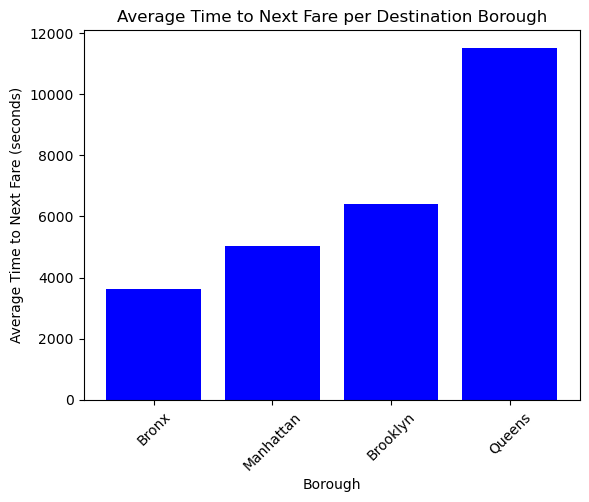

In [60]:
# Plot the average times
boroughs_sorted, times_sorted = zip(*avg_times)
plt.bar(boroughs_sorted, times_sorted, color='blue')
plt.title('Average Time to Next Fare per Destination Borough')
plt.xlabel('Borough')
plt.ylabel('Average Time to Next Fare (seconds)')
plt.xticks(rotation=45)
plt.show()

============= Query 3 ============= 

In [62]:
nyc_boroughs = gpd.read_file('nyc-boroughs.geojson')

# Initialize Spark session with optimized settings
spark = SparkSession.builder \
    .appName("TaxiApp") \
    .config("spark.jars.packages", 'org.apache.spark:spark-sql-kafka-0-10_2.12:3.0.0') \
    .config("spark.sql.streaming.backpressure.enabled", True) \
    .config("spark.sql.streaming.minBatchesToRetain", 2) \
    .config("spark.sql.shuffle.partitions", 4) \
    .config("spark.sql.streaming.stateStore.maintenanceInterval", "10s") \
    .config("spark.sql.streaming.stateStore.minDeltasForSnapshot", 1) \
    .config("spark.sql.repl.eagerEval.enabled", True) \
    .getOrCreate()

# Define schema for incoming JSON data
schema = StructType([
    StructField("license", StringType(), False),
    StructField("pickup_datetime", StringType(), False),
    StructField("dropoff_datetime", StringType(), False),
    StructField("pickup_longitude", DoubleType(), False),
    StructField("pickup_latitude", DoubleType(), False),
    StructField("dropoff_longitude", DoubleType(), False),
    StructField("dropoff_latitude", DoubleType(), False),
    StructField("timestamp", TimestampType(), False)
])

kafka_server = "localhost:9092"
# Read data from Kafka with optimized settings
lines = (spark.readStream
         .format("kafka")
         .option("kafka.bootstrap.servers", kafka_server)
         .option("subscribe", "stock")
         .option("startingOffsets", "earliest")
         .option("maxOffsetsPerTrigger", 500)
         .load()
         .selectExpr("CAST(value AS STRING) as json_value"))

# Parse JSON data
df = lines.select(from_json(col("json_value"), schema).alias("parsed_value")).select("parsed_value.*")

# Filter to include only necessary columns
df_filtered = df.select(
    col("license"),
    col("pickup_datetime").cast(TimestampType()).alias("pickup_time"),
    col("dropoff_datetime").cast(TimestampType()).alias("dropoff_time"),
    col("pickup_longitude").alias("pickup_longitude"),
    col("pickup_latitude").alias("pickup_latitude"),
    col("dropoff_longitude").alias("dropoff_longitude"),
    col("dropoff_latitude").alias("dropoff_latitude"),
    col("timestamp")
)

# Add watermark to the timestamp
df_with_watermark = df_filtered.withWatermark("timestamp", "1 hour")

# Define a function to map coordinates to borough
def get_borough(longitude, latitude, nyc_boroughs):
    point = Point(longitude, latitude)
    for _, row in nyc_boroughs.iterrows():
        if row['geometry'].contains(point):
            return row['borough']
    return None

# Define the function to process each batch
def process_batch(df, epoch_id):
    # Convert Spark DataFrame to Pandas for geospatial processing
    pdf = df.toPandas()
    
    # Map pickup and dropoff coordinates to borough
    pdf['pickup_borough'] = pdf.apply(lambda row: get_borough(row['pickup_longitude'], row['pickup_latitude'], nyc_boroughs), axis=1)
    pdf['dropoff_borough'] = pdf.apply(lambda row: get_borough(row['dropoff_longitude'], row['dropoff_latitude'], nyc_boroughs), axis=1)
    
    # Filter trips that started and ended within the same borough
    pdf_same_borough = pdf[pdf['pickup_borough'] == pdf['dropoff_borough']]
    
    # Convert back to Spark DataFrame
    spark_df_same_borough = spark.createDataFrame(pdf_same_borough)
    
    # Compute the number of trips that started and ended within the same borough in the last hour
    trips_same_borough = spark_df_same_borough.groupBy(
        window(spark_df_same_borough.timestamp, "1 hour"), spark_df_same_borough.pickup_borough
    ).count().alias("count_same_borough")
    
    # Collect results to Pandas DataFrame for visualization
    pdf_results = trips_same_borough.toPandas()
    
    # Save results for visualization (optional)
    pdf_results.to_csv(f'trips_same_borough_{epoch_id}.csv', index=False)
    
    # Print results to console for debugging
    trips_same_borough.show(truncate=False)
    
    # Append results to a global list (for later visualization)
    global results
    results.append(pdf_results)

# List to collect the results
results = []

# Apply the function on each micro-batch
query = df_with_watermark.writeStream.foreachBatch(process_batch).start()

# Define a function to stop the query after a timeout
def stop_query_after_timeout(query, timeout):
    import time
    time.sleep(timeout)
    query.stop()
    print(f"Query stopped after {timeout} seconds.")

# Start a thread to stop the query after 60 seconds
timeout_thread = threading.Thread(target=stop_query_after_timeout, args=(query, 180))
timeout_thread.start()

# Await termination to keep the query running
query.awaitTermination()

# Combine all results into a single DataFrame
df_combined_results = pd.concat(results, ignore_index=True)

# Save the combined results to a CSV file (optional)
df_combined_results.to_csv('combined_trips_same_borough.csv', index=False)





24/06/09 17:16:24 WARN ResolveWriteToStream: Temporary checkpoint location created which is deleted normally when the query didn't fail: /private/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/temporary-be06fdde-2265-4811-9956-97307d3b809f. If it's required to delete it under any circumstances, please set spark.sql.streaming.forceDeleteTempCheckpointLocation to true. Important to know deleting temp checkpoint folder is best effort.
24/06/09 17:16:24 WARN ResolveWriteToStream: spark.sql.adaptive.enabled is not supported in streaming DataFrames/Datasets and will be disabled.


+------------------------------------------+--------------+-----+
|window                                    |pickup_borough|count|
+------------------------------------------+--------------+-----+
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |371  |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Brooklyn      |13   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Queens        |5    |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Bronx         |2    |
+------------------------------------------+--------------+-----+

+------------------------------------------+--------------+-----+
|window                                    |pickup_borough|count|
+------------------------------------------+--------------+-----+
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Queens        |12   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |378  |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Brooklyn      |10   |
+------------------------------------------+--------------+-----+

+-------

ERROR:py4j.clientserver:There was an exception while executing the Python Proxy on the Python Side.
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.11/site-packages/py4j/clientserver.py", line 617, in _call_proxy
    return_value = getattr(self.pool[obj_id], method)(*params)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/utils.py", line 120, in call
    raise e
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/utils.py", line 117, in call
    self.func(DataFrame(jdf, wrapped_session_jdf), batch_id)
  File "/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/ipykernel_31114/606177997.py", line 85, in process_batch
    pdf_results = trips_same_borough.toPandas()
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/pyspark/sql/pandas/conversion.py", line 202, in toPandas
    rows = self.collect()
           ^^^^^^^^^^^^^^
  File "/

Query stopped after 180 seconds.


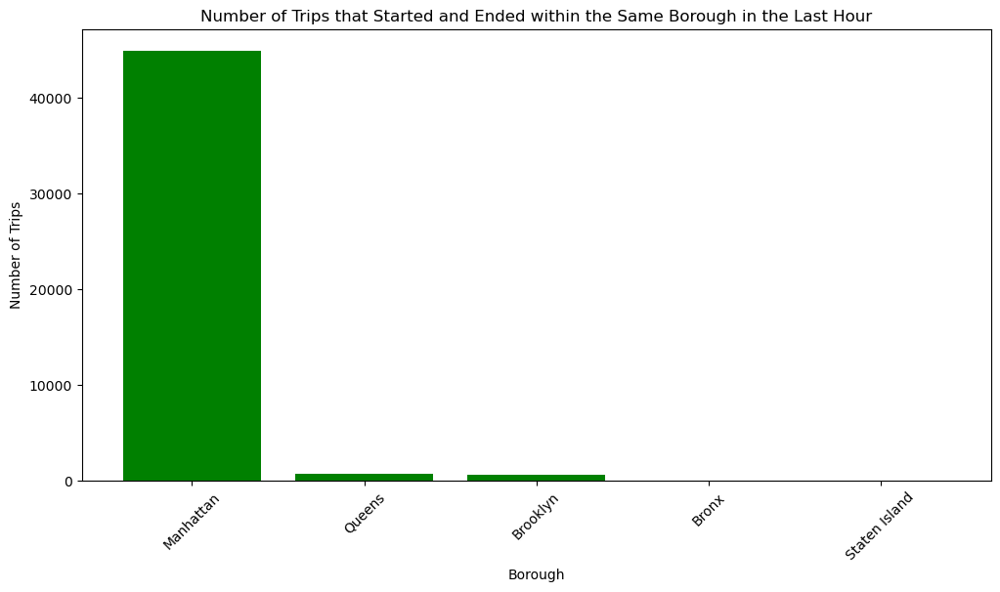

In [63]:
import matplotlib.pyplot as plt

# Load the results from CSV file
df_combined_results = pd.read_csv('combined_trips_same_borough.csv')

# Plot the results
plt.figure(figsize=(12, 6))
boroughs = df_combined_results['pickup_borough'].unique()

# Create a list to store counts for each borough
trip_counts = []

for borough in boroughs:
    subset = df_combined_results[df_combined_results['pickup_borough'] == borough]
    trip_count = subset['count'].sum()
    trip_counts.append((borough, trip_count))

# Sort the boroughs by trip count for better visualization
trip_counts.sort(key=lambda x: x[1], reverse=True)

# Plot the trip counts
boroughs_sorted, counts_sorted = zip(*trip_counts)
plt.bar(boroughs_sorted, counts_sorted, color='green')

plt.title('Number of Trips that Started and Ended within the Same Borough in the Last Hour')
plt.xlabel('Borough')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)
plt.show()


=========== QUERY 4 ============

In [ ]:
# Load NYC boroughs GeoJSON file
nyc_boroughs = gpd.read_file('nyc-boroughs.geojson')

# Initialize Spark session with optimized settings
spark = SparkSession.builder \
    .appName("TaxiApp") \
    .config("spark.jars.packages", 'org.apache.spark:spark-sql-kafka-0-10_2.12:3.0.0') \
    .config("spark.sql.streaming.backpressure.enabled", True) \
    .config("spark.sql.streaming.minBatchesToRetain", 2) \
    .config("spark.sql.shuffle.partitions", 4) \
    .config("spark.sql.streaming.stateStore.maintenanceInterval", "10s") \
    .config("spark.sql.streaming.stateStore.minDeltasForSnapshot", 1) \
    .config("spark.sql.repl.eagerEval.enabled", True) \
    .getOrCreate()

# Define schema for incoming JSON data
schema = StructType([
    StructField("license", StringType(), False),
    StructField("pickup_datetime", StringType(), False),
    StructField("dropoff_datetime", StringType(), False),
    StructField("pickup_longitude", DoubleType(), False),
    StructField("pickup_latitude", DoubleType(), False),
    StructField("dropoff_longitude", DoubleType(), False),
    StructField("dropoff_latitude", DoubleType(), False),
    StructField("timestamp", TimestampType(), False)
])

kafka_server = "localhost:9092"
# Read data from Kafka with optimized settings
lines = (spark.readStream
         .format("kafka")
         .option("kafka.bootstrap.servers", kafka_server)
         .option("subscribe", "stock")
         .option("startingOffsets", "earliest")
         .option("maxOffsetsPerTrigger", 500)
         .load()
         .selectExpr("CAST(value AS STRING) as json_value"))

# Parse JSON data
df = lines.select(from_json(col("json_value"), schema).alias("parsed_value")).select("parsed_value.*")

# Filter to include only necessary columns
df_filtered = df.select(
    col("license"),
    col("pickup_datetime").cast(TimestampType()).alias("pickup_time"),
    col("dropoff_datetime").cast(TimestampType()).alias("dropoff_time"),
    col("pickup_longitude").alias("pickup_longitude"),
    col("pickup_latitude").alias("pickup_latitude"),
    col("dropoff_longitude").alias("dropoff_longitude"),
    col("dropoff_latitude").alias("dropoff_latitude"),
    col("timestamp")
)

# Add watermark to the timestamp
df_with_watermark = df_filtered.withWatermark("timestamp", "1 hour")

# Define a function to map coordinates to borough
def get_borough(longitude, latitude, nyc_boroughs):
    point = Point(longitude, latitude)
    for _, row in nyc_boroughs.iterrows():
        if row['geometry'].contains(point):
            return row['borough']
    return None

# Define the function to process each batch
def process_batch(df, epoch_id):
    # Convert Spark DataFrame to Pandas for geospatial processing
    pdf = df.toPandas()
    
    # Map pickup and dropoff coordinates to borough
    pdf['pickup_borough'] = pdf.apply(lambda row: get_borough(row['pickup_longitude'], row['pickup_latitude'], nyc_boroughs), axis=1)
    pdf['dropoff_borough'] = pdf.apply(lambda row: get_borough(row['dropoff_longitude'], row['dropoff_latitude'], nyc_boroughs), axis=1)
    
    # Filter trips that started in one borough and ended in another
    pdf_diff_boroughs = pdf[pdf['pickup_borough'] != pdf['dropoff_borough']]
    
    # Convert back to Spark DataFrame
    spark_df_diff_boroughs = spark.createDataFrame(pdf_diff_boroughs)
    
    # Compute the number of trips that started in one borough and ended in another in the last hour
    trips_diff_boroughs = spark_df_diff_boroughs.groupBy(
        window(spark_df_diff_boroughs.timestamp, "1 hour"), spark_df_diff_boroughs.pickup_borough, spark_df_diff_boroughs.dropoff_borough
    ).count().alias("count_diff_boroughs")
    
    # Collect results to Pandas DataFrame for visualization
    pdf_results = trips_diff_boroughs.toPandas()
    
    # Save results for visualization (optional)
    pdf_results.to_csv(f'trips_diff_boroughs_{epoch_id}.csv', index=False)
    
    # Print results to console for debugging
    trips_diff_boroughs.show(truncate=False)
    
    # Append results to a global list (for later visualization)
    global results
    results.append(pdf_results)

# List to collect the results
results = []

# Apply the function on each micro-batch
query = df_with_watermark.writeStream.foreachBatch(process_batch).start()

# Define a function to stop the query after a timeout
def stop_query_after_timeout(query, timeout):
    import time
    time.sleep(timeout)
    query.stop()
    print(f"Query stopped after {timeout} seconds.")

# Start a thread to stop the query after 60 seconds
timeout_thread = threading.Thread(target=stop_query_after_timeout, args=(query, 180))
timeout_thread.start()

# Await termination to keep the query running
query.awaitTermination()

# Combine all results into a single DataFrame
df_combined_results = pd.concat(results, ignore_index=True)

# Save the combined results to a CSV file (optional)
df_combined_results.to_csv('combined_trips_diff_boroughs.csv', index=False)

24/06/09 17:19:26 WARN ResolveWriteToStream: Temporary checkpoint location created which is deleted normally when the query didn't fail: /private/var/folders/pf/3w773sn14tb__h8z5cn0jtqm0000gp/T/temporary-8abcba89-1a3c-40da-8a38-caa3c0158cc1. If it's required to delete it under any circumstances, please set spark.sql.streaming.forceDeleteTempCheckpointLocation to true. Important to know deleting temp checkpoint folder is best effort.
24/06/09 17:19:26 WARN ResolveWriteToStream: spark.sql.adaptive.enabled is not supported in streaming DataFrames/Datasets and will be disabled.


+------------------------------------------+--------------+---------------+-----+
|window                                    |pickup_borough|dropoff_borough|count|
+------------------------------------------+--------------+---------------+-----+
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |Brooklyn       |37   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |Queens         |29   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Queens        |Manhattan      |15   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Brooklyn      |Queens         |3    |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|NULL          |NULL           |12   |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Queens        |Brooklyn       |3    |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Brooklyn      |Manhattan      |5    |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |NULL           |3    |
|{2024-06-09 18:00:00, 2024-06-09 19:00:00}|Manhattan     |Bronx          |2    |
+---------------

In [ ]:
# Visualization in the next cell
import matplotlib.pyplot as plt

# Load the results from CSV file
df_combined_results = pd.read_csv('combined_trips_diff_boroughs.csv')

# Plot the results
plt.figure(figsize=(12, 6))
boroughs = df_combined_results['pickup_borough'].unique()

# Create a list to store counts for each borough pair
trip_counts = []

for borough in boroughs:
    subset = df_combined_results[df_combined_results['pickup_borough'] == borough]
    for dropoff_borough in subset['dropoff_borough'].unique():
        trip_count = subset[subset['dropoff_borough'] == dropoff_borough]['count'].sum()
        trip_counts.append((borough, dropoff_borough, trip_count))

# Sort the borough pairs by trip count for better visualization
trip_counts.sort(key=lambda x: x[2], reverse=True)

# Plot the trip counts
pickup_boroughs_sorted, dropoff_boroughs_sorted, counts_sorted = zip(*trip_counts)
plt.barh(range(len(counts_sorted)), counts_sorted, color='orange')
plt.yticks(range(len(counts_sorted)), [f'{p} to {d}' for p, d in zip(pickup_boroughs_sorted, dropoff_boroughs_sorted)])

plt.title('Number of Trips that Started in One Borough and Ended in Another in the Last Hour')
plt.xlabel('Number of Trips')
plt.ylabel('Borough Pairs')
plt.show()